# Introduction to Web Feature Service (WFS)

The Web Feature Service (WFS) is a standard created by the Open Geospatial Consortium (OGC) for creating, modifying and exchanging geospatial data in vector format. A WFS encodes and transfers information in Geography Markup Language (GML) which is a subset of XML. The current version of WFS is 2.0.0, but there are also earlier versions 1.1.0 and 1.0.0 which are also still in use. Although there are some differences between the versions, the syntax between versions often remains the same.



## Where to find WFS providers?


### Global coverage
- [Spatineo Directory](https://directory.spatineo.com/):
    - Very useful service to explore WFS providers in different countries. 
    - You can easily find the WFS endpoint address for each provider.
    - Includes information about the stability and quality of the service. 

### European coverage

- [Inspire Geoportal](https://inspire-geoportal.ec.europa.eu/index.html)
   - You can easily explore the Inspire providers.
   - Not possible to find WFS endpoint URLs ..(??)

### Finnish coverage

- [Avoindata.fi](https://www.avoindata.fi/en)
- [Helsinki Region Infoshare](https://hri.fi/data/en_GB/group/59b85a25-5cf1-4eb8-a0b7-92ffe34efdad?res_format=WFS)

### Estonian coverage

- [Estonian Open Data portal](https://avaandmed.eesti.ee/)




## Retreaving data via WFS to geopandas

To work with OGC APIs in Python, there is a library called [**OWSLib**](https://geopython.github.io/OWSLib/index.html) which works with standards such as [WFS](https://geopython.github.io/OWSLib/usage.html#wfs), [WMS](https://geopython.github.io/OWSLib/usage.html#wms) etc. It supports all (or at least majority) of the functionalities specified in the OGC standards. 

To make things a bit easier to work, there is also an experimental library called `geostream` which is built on top of OWSLib. The [geostream](https://github.com/geostream-org/geostream) library directly converts the data into geopandas GeoDataFrames and overall makes it a bit easier to work with WFS APIs. The library is in the early days of development and still experimental by nature. In the following we will see how it works:

In [1]:
from geostream import WFS
import geopandas as gpd

In [2]:
endpoint = "https://inspire.geoportaal.ee/geoserver/TN_teeregister/wfs"
api = WFS(endpoint)

In [3]:
# Via .wfs object we can access all the functionalities provided by OWSLib, such as seeing the abstract description for the WFS
api.wfs.identification.abstract

'Sisaldab Eesti teeregistri teid.'

In [4]:
layers = api.get_layers()
layers

['TN_teeregister:TN.RoadTransportNetwork.RoadLink_eteed',
 'TN_teeregister:TN.RoadTransportNetwork.FunctionalRoadClass',
 'TN_teeregister:TN.RoadTransportNetwork.NumberOfLanes',
 'TN_teeregister:TN.RoadTransportNetwork.Road',
 'TN_teeregister:TN.RoadTransportNetwork.RoadSurfaceCategory',
 'TN_teeregister:TN.RoadTransportNetwork.Roadwidth',
 'TN_teeregister:TN.RoadTransportNetwork.RoadLink']

In [5]:
api.get_layer_info(layers[0])

{'crsOptions': [urn:ogc:def:crs:EPSG::3301],
 'boundingBox': (23.41994981394858,
  57.55461990262201,
  28.208216378676774,
  59.478274255322894,
  urn:ogc:def:crs:EPSG::3301),
 'boundingBoxWGS84': (20.776261739109742,
  6.571349317973539,
  20.776291969635007,
  6.571363185346309),
 'title': 'Eesti teeregister (E-teed)',
 'id': 'TN_teeregister:TN.RoadTransportNetwork.RoadLink_eteed',
 'crs_code': 3301,
 'abstract': 'Sisaldab Eesti teeregister rahvusvahelisi teid.',
 'keywords': [None],
 'styles': None}

In [6]:
# Pick one of the layers
layer_id = layers[3]
layer_id

'TN_teeregister:TN.RoadTransportNetwork.Road'

### Extract data from specific area based on a bounding box

WFS supports limiting the data request based on bounding box. The `geostream` library provides some useful functionalities to extract geographic extent Polygons for any part of the world based on OpenStreetMap. In the following, we will use the tool to download the boundaries for Tallinn using the `.get_gdf_from_place()` method which returns the boundaries as an output:

In [7]:
# Get the area of interest as GeoDataFrame
tallinn = api.get_gdf_from_place("Tallinn")
tallinn.explore()

/home/hentenka/.conda/envs/mamba/envs/python-gis-book/lib/python3.9/site-packages/osmnx/geocoder.py:110: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf = gdf.append(_geocode_query_to_gdf(q, wr, by_osmid))


### Download the data based on bounding box

After we have retrieved the extent for our request, we can easily **download the data** using the `.load_wfs()` method which takes the layer_id as input and the `bounding_box` as another parameter. The tool automatically creates the WFS call request and returns the data only for the chosen area of interest:

In [8]:
# Load data for given layer_id via WFS
data = api.load_wfs(layer_id, bounding_box=tallinn)

In [9]:
# Show the first rows
data.head()

,id,gml_id,gml_metadataproperty_xlink_href,gml_metadataproperty_xlink_title,gml_original_coordinate_system,gml_parent_property,gml_description,inspireid_identifier_localid,inspireid_identifier_namespace,beginlifespanversion,nationalroadcode,geographicalname_geographicalname_language,geographicalname_geographicalname_spelling_spellingofname_text,xml_ns_uri,geometry
0,TN.RoadTransportNetwork.Road.tee_6206830,tee_6206830,https://metadata.geoportaal.ee/geonetwork/srv/...,Eesti teeregister,http://www.opengis.net/def/crs/EPSG/0/3301,featureMember,Last update:2023-01-23,tee_6206830,ee.transpordiamet.tn.teeregister-teed,2020-11-09,1980663,est,Salu põik,http://inspire.ec.europa.eu/schemas/tn-ro/4.0,"LINESTRING (531689.240 6588344.611, 531731.610..."
1,TN.RoadTransportNetwork.Road.tee_6865295,tee_6865295,https://metadata.geoportaal.ee/geonetwork/srv/...,Eesti teeregister,http://www.opengis.net/def/crs/EPSG/0/3301,featureMember,Last update:2023-01-23,tee_6865295,ee.transpordiamet.tn.teeregister-teed,2020-12-18,2451893,est,Kopra tee,http://inspire.ec.europa.eu/schemas/tn-ro/4.0,"LINESTRING (551561.940 6591713.542, 551547.010..."
2,TN.RoadTransportNetwork.Road.tee_40351,tee_40351,https://metadata.geoportaal.ee/geonetwork/srv/...,Eesti teeregister,http://www.opengis.net/def/crs/EPSG/0/3301,featureMember,Last update:2023-01-23,tee_40351,ee.transpordiamet.tn.teeregister-teed,2021-09-24,7841203,est,Laagna tee,http://inspire.ec.europa.eu/schemas/tn-ro/4.0,"LINESTRING (544279.138 6588124.715, 544282.156..."
3,TN.RoadTransportNetwork.Road.tee_7001773,tee_7001773,https://metadata.geoportaal.ee/geonetwork/srv/...,Eesti teeregister,http://www.opengis.net/def/crs/EPSG/0/3301,featureMember,Last update:2023-01-23,tee_7001773,ee.transpordiamet.tn.teeregister-teed,2021-03-18,1982736,est,Künka tee,http://inspire.ec.europa.eu/schemas/tn-ro/4.0,"LINESTRING (533661.199 6588468.106, 533633.977..."
4,TN.RoadTransportNetwork.Road.tee_6416,tee_6416,https://metadata.geoportaal.ee/geonetwork/srv/...,Eesti teeregister,http://www.opengis.net/def/crs/EPSG/0/3301,featureMember,Last update:2023-01-23,tee_6416,ee.transpordiamet.tn.teeregister-teed,2021-09-28,7844298,est,Mustamäe - Tee 26,http://inspire.ec.europa.eu/schemas/tn-ro/4.0,"LINESTRING (537908.806 6585656.426, 537989.845..."


<AxesSubplot:>

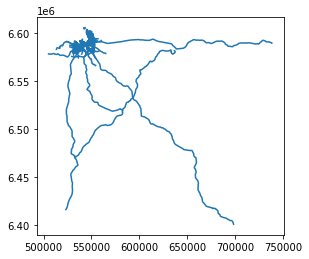

In [10]:
# Plot the data as a static map
data.plot()

In [11]:
# Explore the data on an interactive map
data[["id", "geometry"]].explore()

In [12]:
# Ensure that the Tallinn boundary is in the same CRS
tallinn = tallinn.to_crs(crs=data.crs)

# Limit the data to only areas within the extent of Tallinn
selected = gpd.sjoin(data, tallinn[["geometry"]], predicate="within")

# One of the data types is in datetime format which does not work well with folium..
selected["beginlifespanversion"] = selected["beginlifespanversion"].astype(str)

# Look on the map
selected.explore()

### Data for Helsinki

In the following example, we download some building data from Helsinki Region.

In [34]:
from geostream import WFS

# Endpoint for WFS API of the City of Helsinki
endpoint = "https://kartta.hel.fi/ws/geoserver/avoindata/wfs"

# Initialize WFS reader
api = WFS(endpoint, version="2.0.0")

# See all available layers
layers = api.get_layers()

In [17]:
# Check all layers (uncomment)
# layers

In [18]:
# Define the layer name (based on the list from previous api.get_layers() command)
layer_id = 'avoindata:Rakennukset_alue'

# Find info for specific layer
api.get_layer_info(layer_id)

{'crsOptions': [urn:ogc:def:crs:EPSG::3879,
  urn:ogc:def:crs:EPSG::3067,
  urn:ogc:def:crs:EPSG::4326,
  urn:ogc:def:crs:EPSG::3857],
 'boundingBox': (24.764732945863038,
  59.90927898645569,
  25.289558715996222,
  60.322459856333225,
  urn:ogc:def:crs:EPSG::4326),
 'boundingBoxWGS84': (24.764732945863038,
  59.90927898645569,
  25.289558715996222,
  60.322459856333225),
 'title': 'Rakennukset_alue',
 'id': 'avoindata:Rakennukset_alue',
 'crs_code': 3879,
 'abstract': 'Helsingin rakennukset paikkatietoaineisto perustuu kantakartan rakennuskohteisiin, jotka ovat geometrialtaan alueita (polygon). Aineistossa on mukana kaikki kantakartan aluemaiset kohteet.',
 'keywords': [],
 'styles': None}

In [35]:
# Download a GeoDataFrame with Kamppi district as the extent
extent = api.get_gdf_from_place("Kamppi, Helsinki")

# Download the data into GeoDataFrame from the given area
data = api.load_wfs(layer_id=layer_id, bounding_box=extent)

/home/hentenka/.conda/envs/mamba/envs/python-gis-book/lib/python3.9/site-packages/osmnx/geocoder.py:110: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf = gdf.append(_geocode_query_to_gdf(q, wr, by_osmid))


In [36]:
# Show first rows
data.head()

,id,kuntarekisteri_id,ratu,vtj_prt,ratu_vastaavuus,ratu_vastaavuus_koodi,ratu_laatu,ratu_laatu_koodi,tila,tila_koodi,...,tyyppi_koodi,luontipvm,muokkauspvm,katunimi_suomi,katunimi_ruotsi,osoitenumero,postinumero,datanomistaja,paivitetty_tietopalveluun,geometry
0,739911,405.0,405.0,1030461788,1/1 = 1 geometria / 1 RATU,1,määritelty luotettavasti,1,voimassa,2,...,2,2012-06-09,2012-09-19,Asema-aukio,Stationsplatsen,2,00100,Helsinki/Kami,2023-01-24,"POLYGON ((25496555.653 6673103.544, 25496554.5..."
1,739940,401.0,401.0,1030461766,1/1 = 1 geometria / 1 RATU,1,määritelty luotettavasti,1,voimassa,2,...,6,2012-06-09,2012-09-19,Mikonkatu,Mikaelsgatan,10,00100,Helsinki/Kami,2023-01-24,"POLYGON ((25496883.768 6673042.832, 25496883.7..."
2,739779,406.0,406.0,103046180A,1/1 = 1 geometria / 1 RATU,1,määritelty luotettavasti,1,voimassa,2,...,6,2014-02-13,2014-03-11,Mannerheiminaukio,Mannerheimplatsen,1,00100,Helsinki/Kami,2023-01-24,"POLYGON ((25496556.798 6673232.594, 25496556.8..."
3,740139,396.0,396.0,103046168X,1/1 = 1 geometria / 1 RATU,1,määritelty luotettavasti,1,voimassa,2,...,2,2013-04-19,2015-05-05,Keskuskatu,Centralgatan,6,00100,Helsinki/Kami,2023-01-24,"POLYGON ((25496813.564 6672987.661, 25496750.0..."
4,739801,588.0,588.0,103056015K,1/1 = 1 geometria / 1 RATU,1,määritelty luotettavasti,1,voimassa,2,...,2,2013-08-30,2015-05-05,Mannerheimintie,Mannerheimvägen,20,00100,Helsinki/Kami,2023-01-24,"POLYGON ((25496515.052 6672882.406, 25496516.1..."


In [37]:
# Explore the data on a map
data.explore()